In [33]:
from pathlib import Path
import os
import cmcrameri.cm as cmc
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from datetime import datetime
import seaborn as sns
import pandas as pd

# 0.1. Import module and case study datasets

In [4]:
# Import the module
from link_to_module import CL61_module as mCL61

In [5]:
# Get the data for case studies 
februar_04 = mCL61.CL61Processor(folder_path='../Data_samples', specific_filename='cl61_20230204.nc')
june28 = mCL61.CL61Processor(folder_path='../Data_samples', specific_filename="cl61_20230628.nc")

Initialization...
- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing=False
load data from specific filne cl61_20230204.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
... module initialization completed !
Initialization...
- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing=False
load data from specific filne cl61_20230628.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
... module initialization completed !


# 0.2. Basic plots and plot style

In [7]:
# Custom Matplotlib plot style (to run before plotting if style changed)

plt.style.use('seaborn-v0_8-white')
#plt.style.use('classic')

custom_style = {
    'axes.grid': False,
    'axes.facecolor': 'white',
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.titlesize': 14,
    'axes.labelsize': 14,
    'xtick.labelsize': 13,
    'ytick.labelsize': 13,
    'lines.linewidth': 2,
    'legend.fontsize': 14,
    'xtick.major.bottom': True,
    'xtick.major.top': False,
    'xtick.major.size': 4,
    'xtick.major.width': 1.5,
    'ytick.major.right': False,
    'ytick.major.left': True,
    'ytick.major.size': 4,
    'ytick.major.width': 1.5
}

# Use the custom style sheet
plt.style.use(custom_style)

#plt.rcParams.keys() # to get info on what can be changed

c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


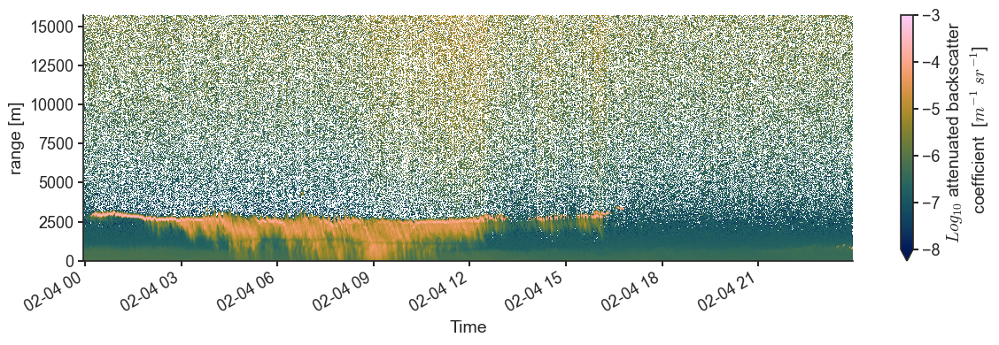

In [8]:
plt.figure(figsize=(12,4))
arr = np.log10(februar_04.dataset['beta_att'])
im = arr.plot.imshow(x = 'time', vmin = -8, vmax = -3,  cmap = cmc.batlow)

cbar = im.colorbar
cbar.set_label('$Log_{10}$ attenuated backscatter \n coefficient  [$m^{-1}~sr^{-1}$]')

plt.title("")
plt.ylabel('range [m]')
plt.tight_layout()
plt.savefig('beta_att.png', dpi = 400)
plt.show()

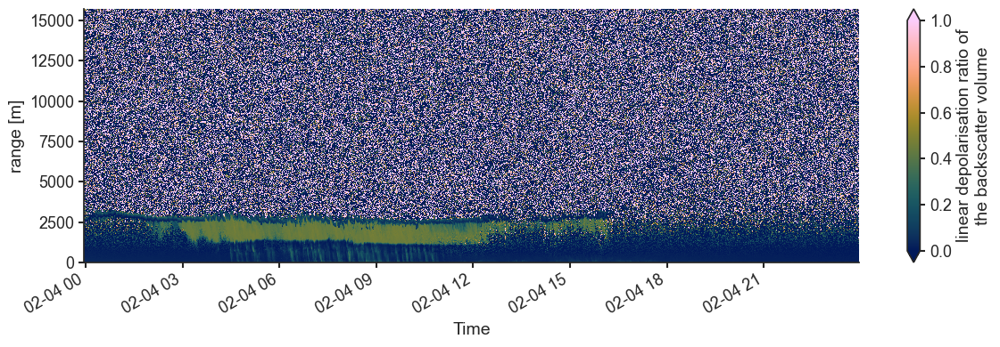

In [9]:
plt.figure(figsize=(12,4))

februar_04.dataset['linear_depol_ratio'].plot.imshow(x = 'time', vmin = 0, vmax = 1, cmap = cmc.batlow)

plt.title("")
plt.ylabel('range [m]')
plt.tight_layout()
plt.savefig('depol_ratio.png', dpi = 400)
plt.show()

array([<Axes: xlabel='Time', ylabel='range [m]'>,
       <Axes: xlabel='Time', ylabel='range [m]'>], dtype=object)

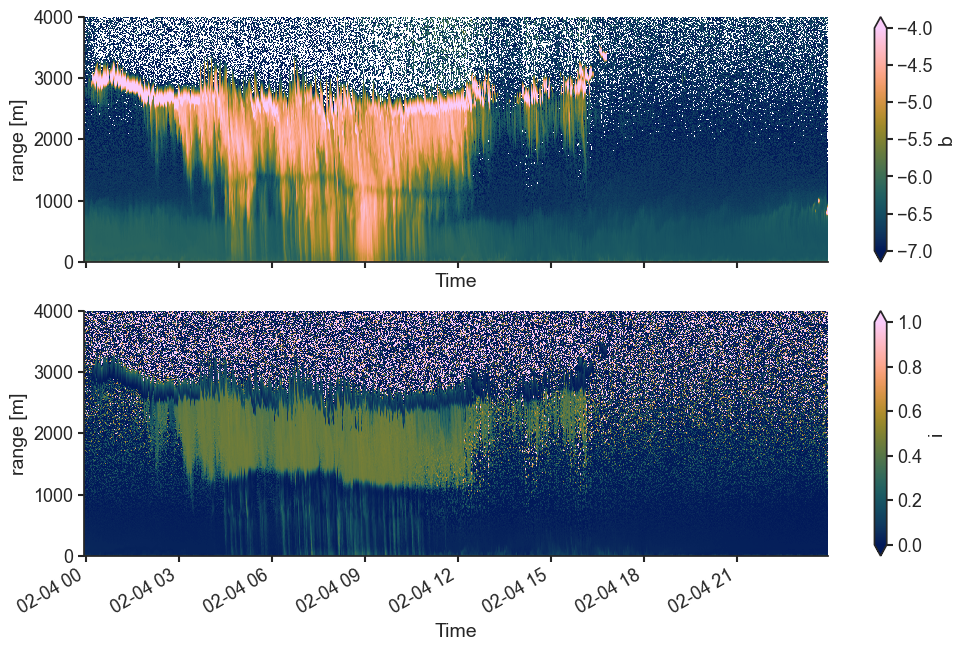

In [10]:
februar_04.plot.show_timeserie(range_limits=[0,4000])

# 0.3. Preprocessing analysis

In [35]:
februar_04.dataset

<xarray.Dataset>
Dimensions:                            (time: 1440, layer: 5, range: 3276)
Coordinates:
  * time                               (time) datetime64[ns] 2023-02-03T23:57...
  * range                              (range) float64 0.0 4.8 ... 1.572e+04
  * layer                              (layer) float64 1.0 2.0 3.0 4.0 5.0
    longitude                          float64 7.361
    latitude                           float64 46.22
Data variables: (12/28)
    cloud_base_heights                 (time, layer) float64 ...
    vertical_visibility                (time) float64 ...
    p_pol                              (time, range) float32 1.789e-06 ... 1....
    x_pol                              (time, range) float32 2.187e-07 ... -1...
    beta_att                           (time, range) float32 2.007e-06 ... 8....
    linear_depol_ratio                 (time, range) float32 0.1223 ... -0.1736
    ...                                 ...
    linear_depol_ratio_roll_median     (time, range) float32 0.07095 ... -0.1669
    x_pol_roll_mean                    (time, range) float32 9.545e-08 ... -3...
    p_pol_roll_mean                    (time, range) float32 1.176e-06 ... -1...
    beta_att_new                       (time, range) float32 1.271e-06 ... -2...
    linear_depol_ratio_new             (time, range) float32 0.0812 ... 0.1553
    kmean_clusters                     (time, range) float64 nan nan ... nan nan
Attributes:
    title:                                         CL61D, CL61 with Depolariz...
    institution:                                   
    source:                                        CL61EERL
    conventions:                                   CF-1.8
    schema_version:                                1.2
    sw_version:                                    1.1.10
    history:                                       
    comment:                                       
    unit:                                          m
    temporal span of this file in minutes:         5.0
    time between consecutive profiles in seconds:  60

Text(0.5, 0, 'Range: Distance between two measure')

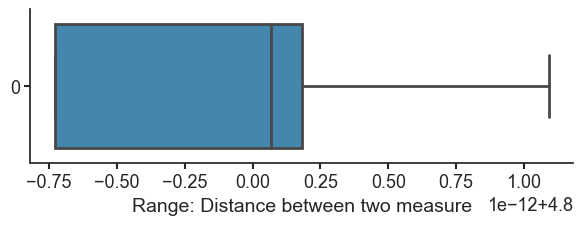

In [11]:
range_val = februar_04.dataset['range'].values
diff_range = range_val[1:]- range_val[:-1]
plt.figure(figsize=(7,2))
sns.boxplot(diff_range, orient='horizontal')
plt.xlabel('Range: Distance between two measure')
#plt.savefig('../Outputs/DistanceRangeSteps.jpg', dpi=200)

Text(0.5, 0, 'Range: Distance between two measure')

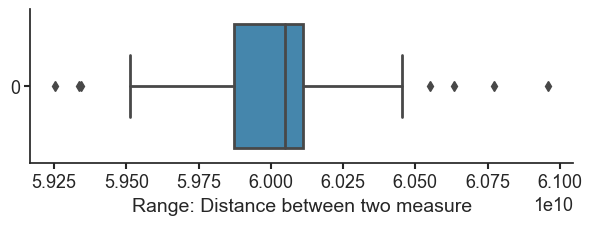

In [12]:
time_val = februar_04.dataset['time'].values
diff_time = time_val[1:]- time_val[:-1]
fig, ax = plt.subplots(1,1, figsize=(7,2))
sns.boxplot(diff_time, orient='horizontal', ax = ax)
xt = ax.get_xticks()
#ax.set_xticklabels(datetime(xt).seconds())
plt.xlabel('Time delta between two measure')
#plt.savefig('../Outputs/DistanceRangeSteps.jpg', dpi=200)

# 1. Noise processing

In the noise processing, the final approach is implemented in the process.mask_noise() method but other methods are also tested.

### i) Main noise processing

The final method is basically:
- Checking if a value inside a rolling windows is noise (outside of expected range)
- Keeping only full valid windows

In [14]:
februar_04.process_noise.mask_noise()

The results are stored under new variable: beta_att_clean, linear_depol_ratio_clean, noise mask and to_interpolate_mask


## ii) Compare with mean and median 

In [15]:
februar_04.process_noise.rolling_window_stats(stat = 'mean', variable_name='beta_att', time_window_size=10, range_window_size=10)
februar_04.process_noise.rolling_window_stats(stat = 'mean', variable_name='linear_depol_ratio', time_window_size=10, range_window_size=10)
None
# 10x10 takes only 10s
# 30x15 takes around 1min

Saved the result as variable : beta_att_roll_mean
Saved the result as variable : linear_depol_ratio_roll_mean


In [16]:
februar_04.process_noise.rolling_window_stats(stat = 'median', variable_name='beta_att', time_window_size=10, range_window_size=10)
februar_04.process_noise.rolling_window_stats(stat = 'median', variable_name='linear_depol_ratio', time_window_size=10, range_window_size=10)
# 7x7 takes around 2 minutes
# 10x10 takes around 7 minutes already

Saved the result as variable : beta_att_roll_median
Saved the result as variable : linear_depol_ratio_roll_median


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to feb04_rollmean_10x10_8000m.jpg


array([<Axes: xlabel='Time', ylabel='range [m]'>,
       <Axes: xlabel='Time', ylabel='range [m]'>], dtype=object)

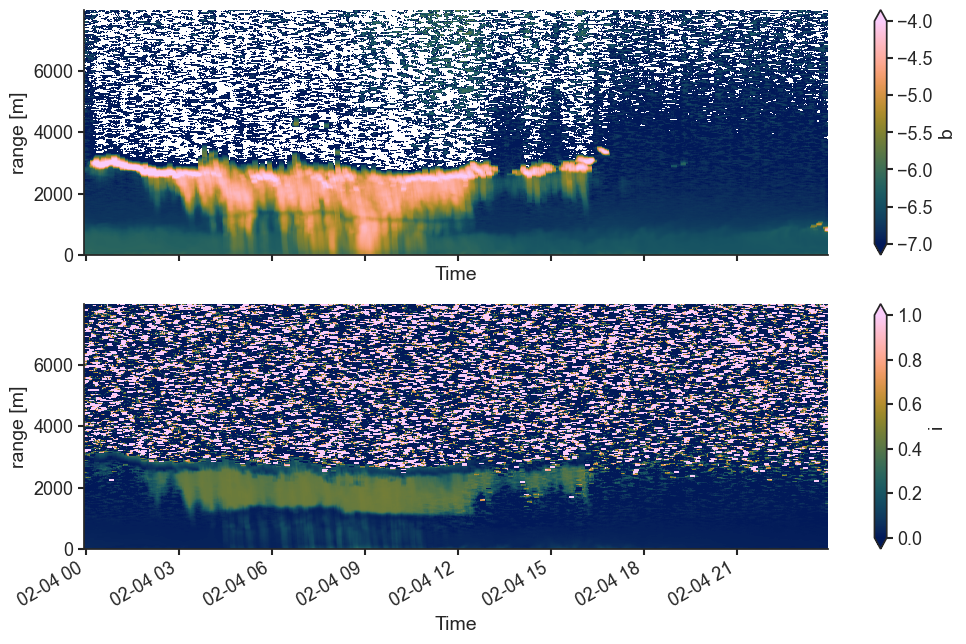

In [18]:
# save_fig='feb04_rol_mean_15x10.jpg'
februar_04.plot.show_timeserie(variable_names=['beta_att_roll_mean', 'linear_depol_ratio_roll_mean'],
                           range_limits=[0,8000], save_fig = '../Outputs/feb04_rollmean_10x10_8000m.jpg')

c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to feb04_rol_median_10x10_8000m.jpg


array([<Axes: xlabel='Time', ylabel='range [m]'>,
       <Axes: xlabel='Time', ylabel='range [m]'>], dtype=object)

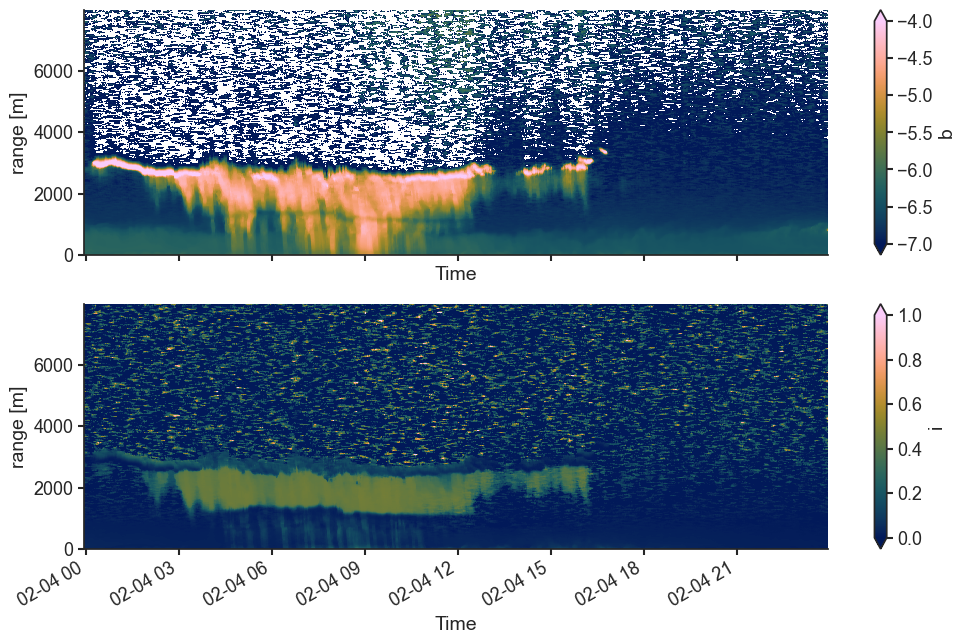

In [19]:
februar_04.plot.show_timeserie(variable_names=['beta_att_roll_median', 'linear_depol_ratio_roll_median'],
                          range_limits=[0,8000], save_fig='../Outputs/feb04_rol_median_10x10_8000m.jpg')

In [20]:
# Define discrete colormaps
arr_cmap = ["#03275C", "#000000", "#1C6061", "#CC933C", "#FCBAC4"]
obj_cmap = {"Royal blue (traditional)":"03275C","Black":"000000","Caribbean Current":"1C6061","Harvest gold":"CC933C","Pink":"FCBAC4"}

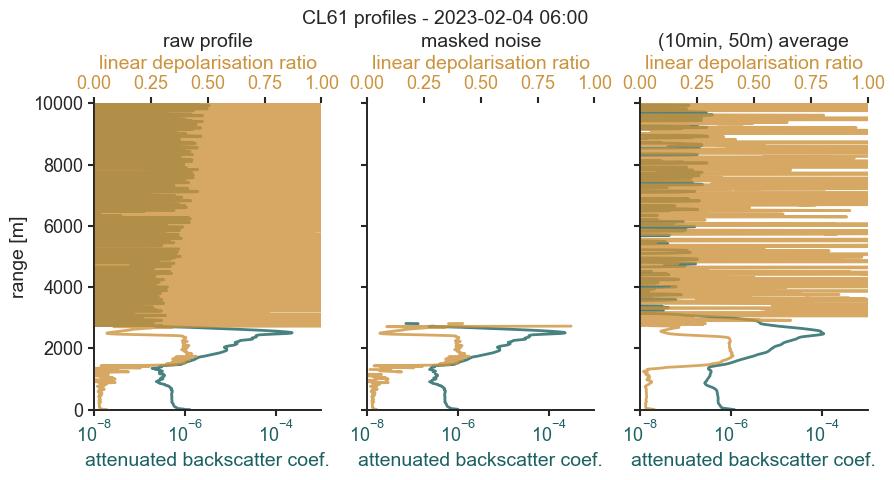

In [21]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1,3, figsize = (9,5), sharey=True)
range_of_interest = [0,10000]
axs[0], axs02 = februar_04.plot.vertical_profile(time_period='2023-02-04 06:00', var_names=['beta_att', 'linear_depol_ratio'],
                                                    var_xlims=[[1e-8, 1e-3], [0,1]],
                                                    xlabel1='attenuated backscatter coef.',
                                                    xlabel2= 'linear depolarisation ratio',
                                                    fig = fig, ax = axs[0],
                                                    range_limits = range_of_interest,
                                                    plot_colors=["#1C6061","#CC933C"],
                                                    title = 'raw profile')

februar_04.plot.vertical_profile(time_period='2023-02-04 06:00', var_names=['beta_att_clean', 'linear_depol_ratio_clean'],
                                 var_xlims=[[1e-8, 1e-3], [0,1]],
                                 xlabel1='attenuated backscatter coef.',
                                 xlabel2= 'linear depolarisation ratio',
                                 fig = fig, ax = axs[1],
                                 range_limits = range_of_interest,
                                 plot_colors=["#1C6061","#CC933C"],
                                 title = 'masked noise')
axs[1].set_ylabel(None)
februar_04.plot.vertical_profile(time_period='2023-02-04 06:00', var_names=['beta_att_roll_mean', 'linear_depol_ratio_roll_mean'],
                                 var_xlims=[[1e-8, 1e-3], [0,1]],
                                 xlabel1='attenuated backscatter coef.',
                                 xlabel2= 'linear depolarisation ratio',
                                 fig = fig, ax = axs[2],
                                 range_limits = range_of_interest,
                                 plot_colors=["#1C6061","#CC933C"],
                                 title = '(10min, 50m) average')
axs[2].set_ylabel(None)

plt.suptitle('CL61 profiles - 2023-02-04 06:00', y = 0.95, fontsize = 14)
plt.tight_layout()
plt.savefig("../Outputs/feb04_06h_compare_profiles_10000.jpg", dpi=300)
plt.show()

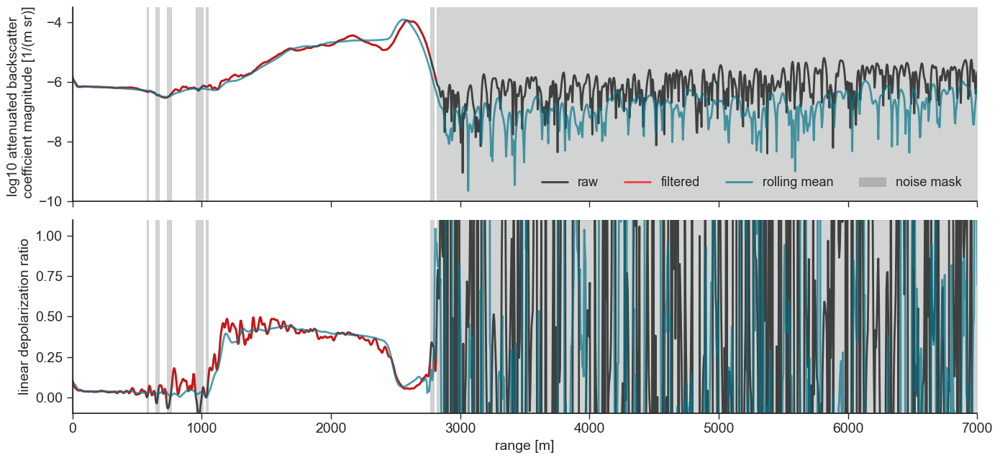

In [22]:
fig, axs = plt.subplots(2, 1, figsize=(14, 6.5), sharex=True)

time_of_interest = '2023-02-04 12:00'
red = '#922b21'
green = '#468407'
blue  = '#047589'
orange = '#e08e23'
fill_clr = '#4c5253'

# Backscatter
a1 = np.log10(np.abs(februar_04.dataset['beta_att'].sel(time=time_of_interest, range=slice(0, 8000)))).plot(ax=axs[0], alpha=0.7, color='black')
a2 = np.log10(februar_04.dataset['beta_att_clean'].sel(time=time_of_interest, range=slice(0, 8000))).plot(ax=axs[0], alpha=0.7, color='red')
a3 = np.log10(np.abs(februar_04.dataset['beta_att_roll_mean'].sel(time=time_of_interest, range=slice(0, 8000)))).plot(ax=axs[0], linewidth=2, alpha=0.7, color=blue)
#a4 = np.log10(np.abs(februar_04.dataset['beta_att_roll_median'].sel(time=time_of_interest, range=slice(0, 8000)))).plot(ax=axs[0], alpha=0.7, color=blue)

# Fill between x-values where beta_att_clean is NaN
beta_att_clean = februar_04.dataset['beta_att_clean'].sel(time=time_of_interest, range=slice(0, 8000))
nan_mask = np.isnan(beta_att_clean).to_dict()['data'][0]

axs[0].set_ylim([-10, -3.5])
axs[0].set_xlabel("")
axs[0].tick_params(axis='y', which='major', labelsize=14)
axs[0].set_ylabel('log10 attenuated backscatter \n coefficient magnitude [1/(m sr)]', fontsize=14)
#axs[0].set_title(f"CL61 profiles - {time_of_interest}", fontsize=14)
axs[0].set_title("")
axs[0].spines['top'].set_visible(False)
axs[0].spines['right'].set_visible(False)


# Identify consecutive ranges where beta_att_clean is NaN
consecutive_ranges = []
start_range = None

for i, is_nan in enumerate(nan_mask):
    if is_nan:
        if start_range is None:
            start_range = i
    elif start_range is not None:
        consecutive_ranges.append((start_range, i - 1))
        start_range = None
if start_range is not None:
    consecutive_ranges.append((start_range, i - 1))

# Fill between consecutive NaN ranges
for start, end in consecutive_ranges:
    axs[0].fill_betweenx(y=np.arange(-12, -2), x1=beta_att_clean['range'][start], x2=beta_att_clean['range'][end], color=fill_clr, alpha=0.25)
    axs[1].fill_betweenx(y=[-0.1, 1.1], x1=beta_att_clean['range'][start], x2=beta_att_clean['range'][end], color=fill_clr, alpha=0.25)

# LDR
februar_04.dataset['linear_depol_ratio'].sel(time=time_of_interest, range=slice(0, 8000)).plot(ax=axs[1], alpha=0.7, color='black')
februar_04.dataset['linear_depol_ratio_clean'].sel(time=time_of_interest, range=slice(0, 8000)).plot(ax=axs[1], alpha=0.7, color='red')
februar_04.dataset['linear_depol_ratio_roll_mean'].sel(time=time_of_interest, range=slice(0, 8000)).plot(ax=axs[1], alpha=0.7, linewidth=2, color=blue)
#februar_04.dataset['linear_depol_ratio_roll_median'].sel(time=time_of_interest, range=slice(0, 8000)).plot(ax=axs[1], alpha=0.8, color=blue)

axs[1].set_ylim([-0.1, 1.1])
axs[1].tick_params(axis='both', which='major', labelsize=14)
axs[1].set_ylabel('linear depolarization ratio', fontsize=14)
axs[1].set_xlabel('range [m]', fontsize=14)
axs[1].set_title("")
axs[1].spines['top'].set_visible(False)
axs[1].spines['right'].set_visible(False)

for ax in axs:
    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1, top=False, right=False)

# Set legend between the two axes in a line
fig.legend(['raw', 'filtered', 'rolling mean', 'noise mask'], fontsize=13, ncol = 4,  bbox_to_anchor=(0.97, 0.64))

plt.xlim([0, 7000])
plt.tight_layout()

plt.savefig('../Outputs/Denoising_comp.png', dpi = 400)
plt.show()

c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


(-9.0, -3.5)

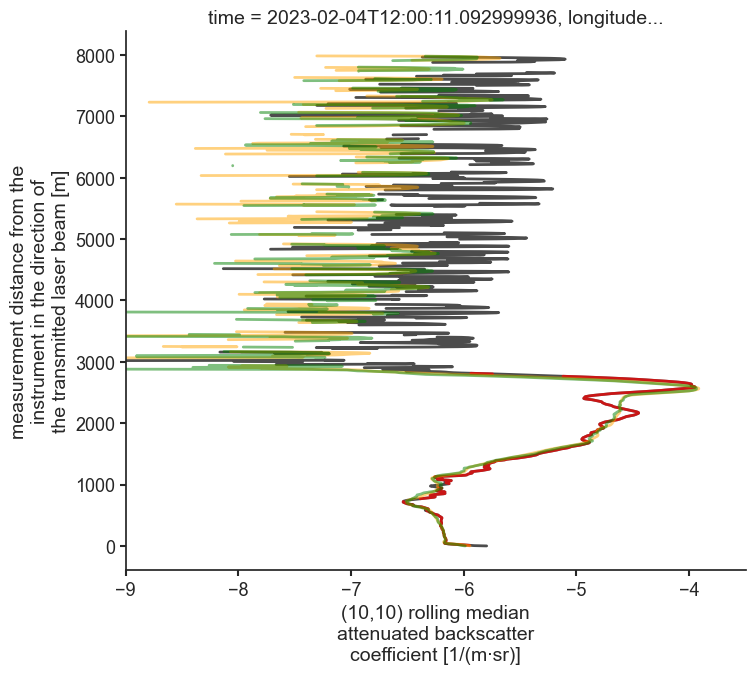

In [23]:
plt.figure(figsize=(8,7))
np.log10(februar_04.dataset['beta_att'].sel(time='2023-02-04 12:00', range=slice(0,8000))).plot(y='range', alpha = 0.7, color = 'black')
np.log10(februar_04.dataset['beta_att_clean'].sel(time='2023-02-04 12:00', range=slice(0,8000))).plot(y='range', alpha = 0.7, color = 'red')
np.log10(februar_04.dataset['beta_att_roll_mean'].sel(time='2023-02-04 12:00', range=slice(0,8000))).plot(y='range', alpha = 0.5, color = 'orange')
np.log10(februar_04.dataset['beta_att_roll_median'].sel(time='2023-02-04 12:00', range=slice(0,8000))).plot(y='range', alpha = 0.5, color = 'green')
plt.xlim([-9, -3.5])

## iv) We could try mean or median filtering on the direct measures

In [24]:
# 15x10 = 15minutes x 50 m
window = (15,10)
februar_04.process_noise.rolling_window_stats(stat = 'mean', variable_name='x_pol', time_window_size=window[0], range_window_size=window[1])
februar_04.process_noise.rolling_window_stats(stat = 'mean', variable_name='p_pol', time_window_size=window[0], range_window_size=window[1])

Saved the result as variable : x_pol_roll_mean
Saved the result as variable : p_pol_roll_mean


In [26]:
februar_04.dataset['beta_att_new'] = februar_04.dataset['p_pol_roll_mean'] + februar_04.dataset['x_pol_roll_mean']
februar_04.dataset['beta_att_new'].attrs['long_name'] = 'sum of mean polarisations'
februar_04.dataset['linear_depol_ratio_new'] = februar_04.dataset['x_pol_roll_mean'] / februar_04.dataset['p_pol_roll_mean']
februar_04.dataset['linear_depol_ratio_new'].attrs['long_name'] = 'mean polarisations ratio'

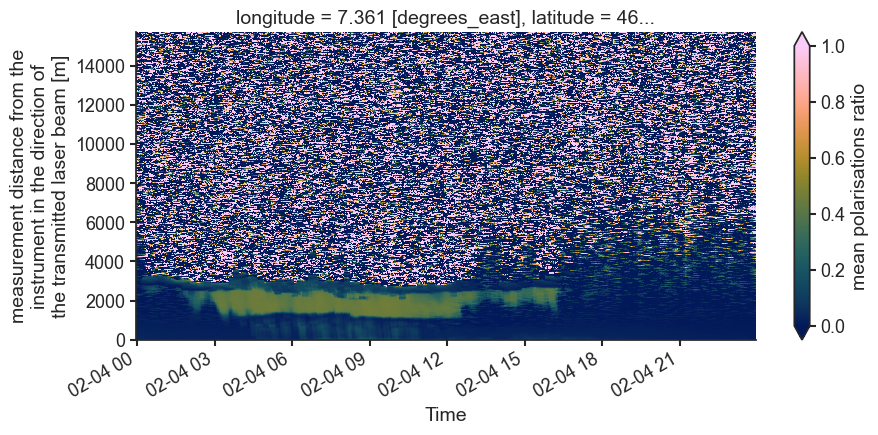

In [29]:
plt.figure(figsize=(10,4))
februar_04.dataset['linear_depol_ratio_new'].T.plot.imshow(vmin=0, vmax = 1, cmap = 'cmc.batlow')

(500.0, 4000.0)

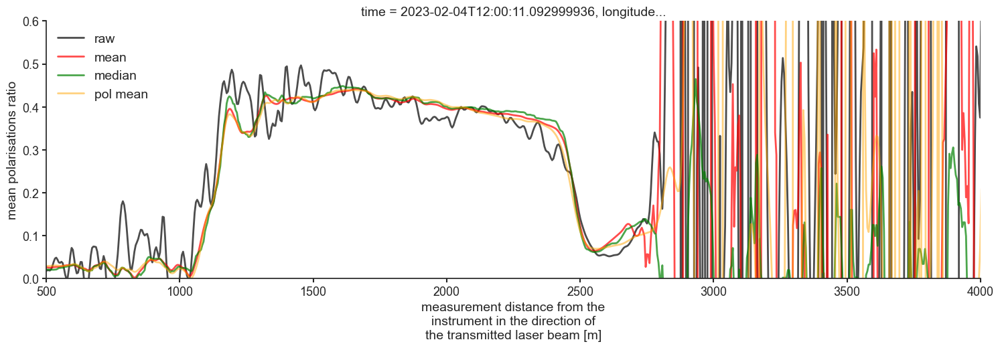

In [31]:
plt.figure(figsize=(18,5))
februar_04.dataset['linear_depol_ratio'].sel(time='2023-02-04 12:00', range=slice(0,8000)).plot(alpha = 0.7, color = 'black')
februar_04.dataset['linear_depol_ratio_roll_mean'].sel(time='2023-02-04 12:00', range=slice(0,8000)).plot(alpha = 0.7, color = 'red')
februar_04.dataset['linear_depol_ratio_roll_median'].sel(time='2023-02-04 12:00', range=slice(0,8000)).plot(alpha = 0.7, color = 'green')
februar_04.dataset['linear_depol_ratio_new'].sel(time='2023-02-04 12:00', range=slice(0,8000)).plot(alpha = 0.5, color = 'orange')
plt.legend(['raw', 'mean', 'median','pol mean'], loc = 'upper left')
plt.ylim([0, 0.6])
plt.xlim([500, 4000])

# 2. Clustering

Text(0.5, 33.26562500000004, '$log_{10}$ filtered attenuated backscatter [$m^{-1}~sr^{-1}$]')

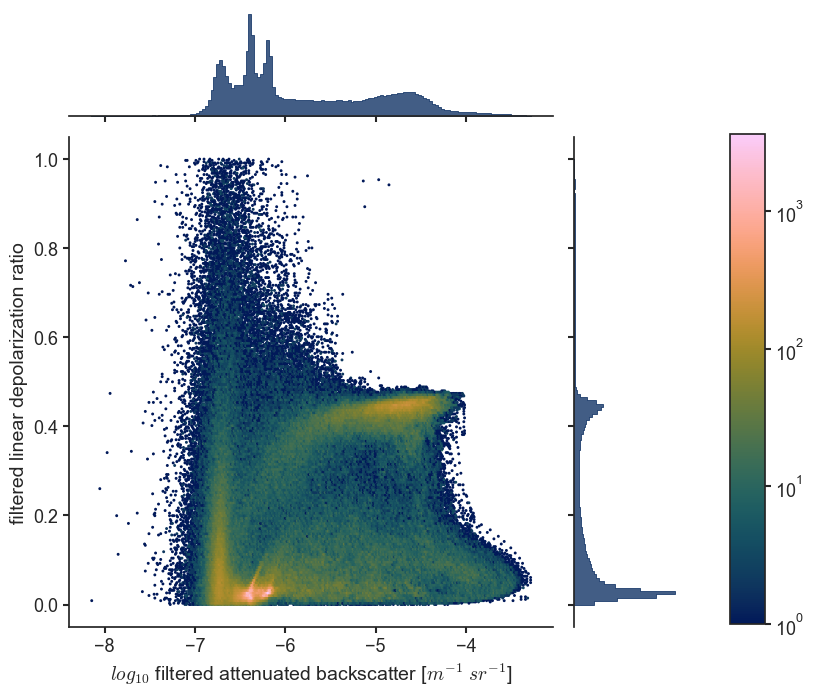

In [32]:
g = februar_04.plot.histogram_2d()
g.ax_joint.set_ylabel('filtered linear depolarization ratio')
g.ax_joint.set_xlabel('$log_{10}$ filtered attenuated backscatter [$m^{-1}~sr^{-1}$]')

(4717440, 3)
Scaler means: [-5.78283455e+00  1.75196911e-01  1.31780207e+03]  
 and scales: [8.24022280e-01 1.74953662e-01 8.67763000e+02]


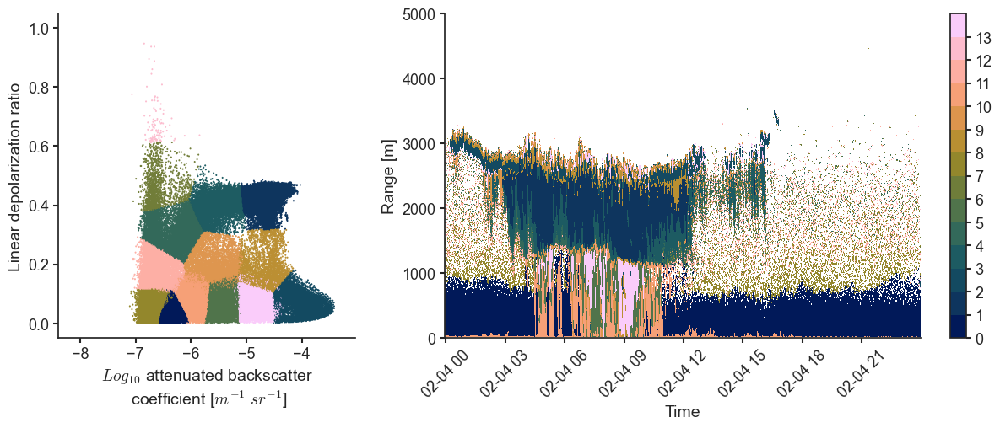

saving results under followingkmean_clusters


In [34]:
fig, axs = februar_04.classification.Kmeans_clustering(cluster_N=14, save_fig='Kmeans_Result_04022023_N14.jpg', plot_range=[0,5000])

# 3. Case study 1: SION Feb 04

In [7]:
# (Re)load dataset if necessary
februar_04 = mCL61.CL61Processor(folder_path='../Data_samples', specific_filename='cl61_20230204.nc')

- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False
load data from specific filne cl61_20230204.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


In [37]:
# Create specific folder 
os.makedirs("../Outputs/Feb04") if not os.path.exists("../Outputs/Feb04") else print("Folder already exists")

Folder already exists


Saving files into ../Outputs/Feb04


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to ../Outputs/Feb04\timeserie.jpg
Step 1: applying noise removal process
The results are stored under new variable: beta_att_clean, linear_depol_ratio_clean, noise mask and to_interpolate_mask
saved figure to ../Outputs/Feb04\denoised_timeserie.jpg


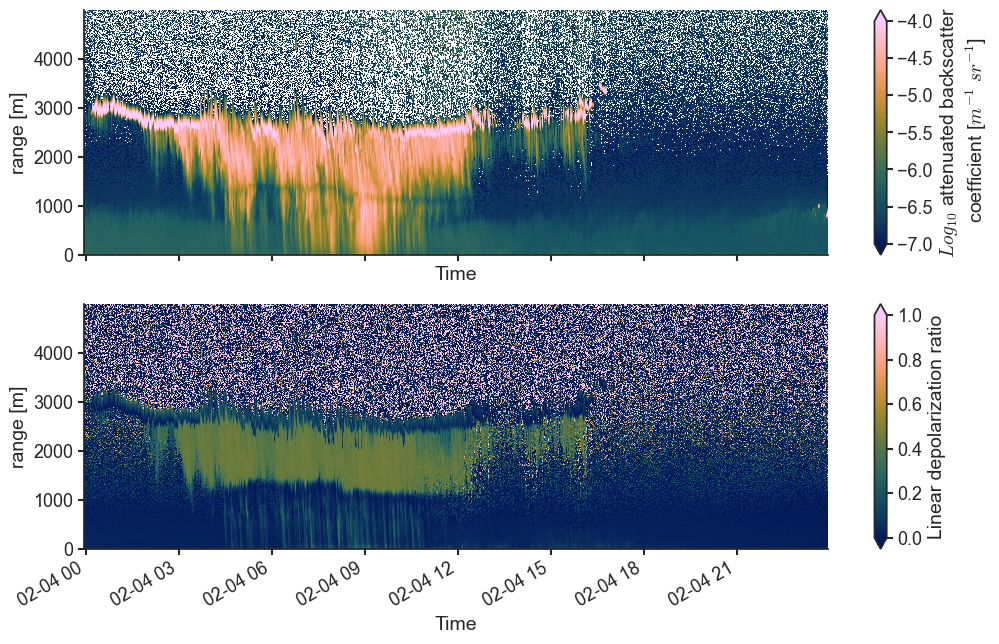

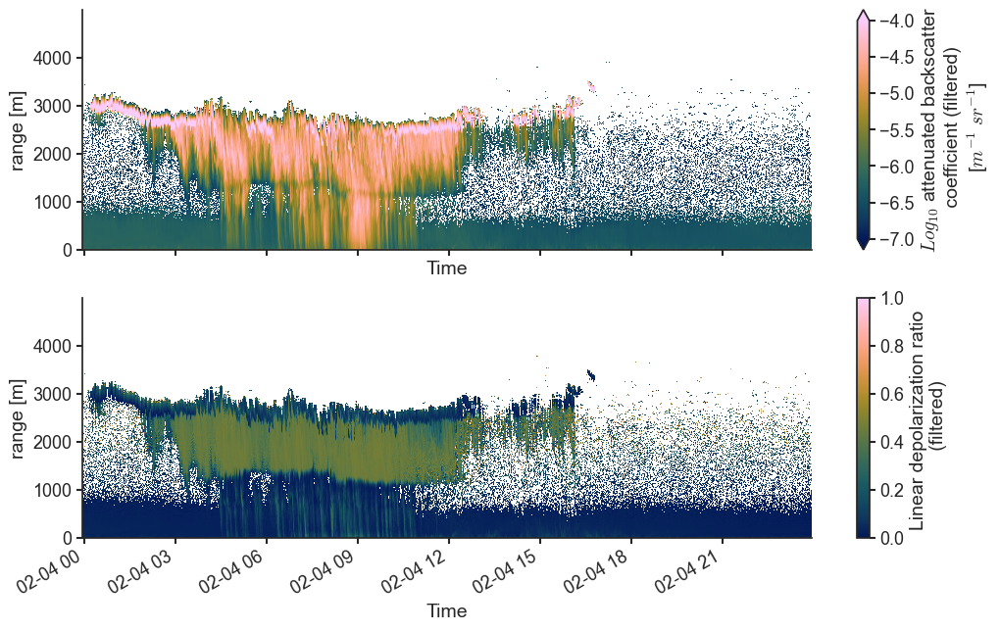

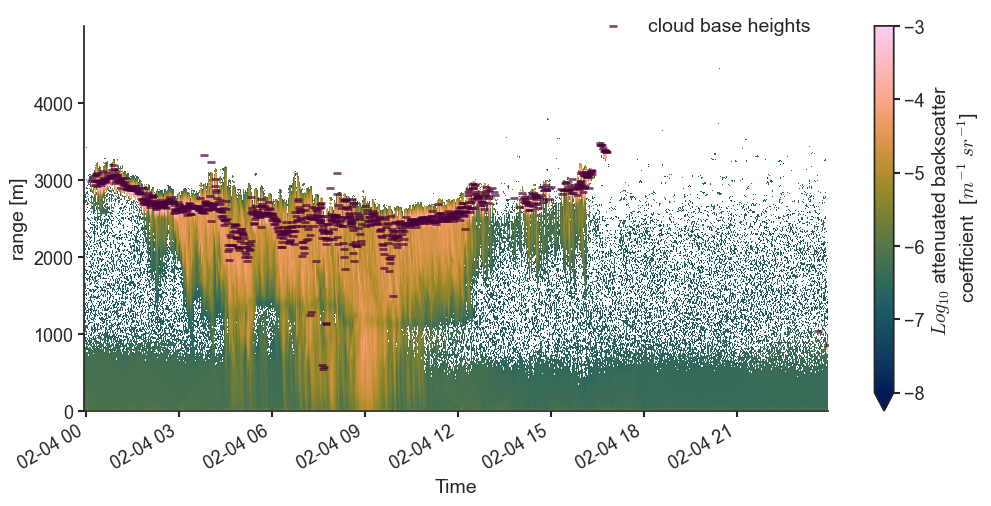

step 2: cluster data with kmean method
(4717440, 3)
Scaler means: [-5.78283455e+00  1.75196911e-01  1.31780207e+03]  
 and scales: [8.24022280e-01 1.74953662e-01 8.67763000e+02]


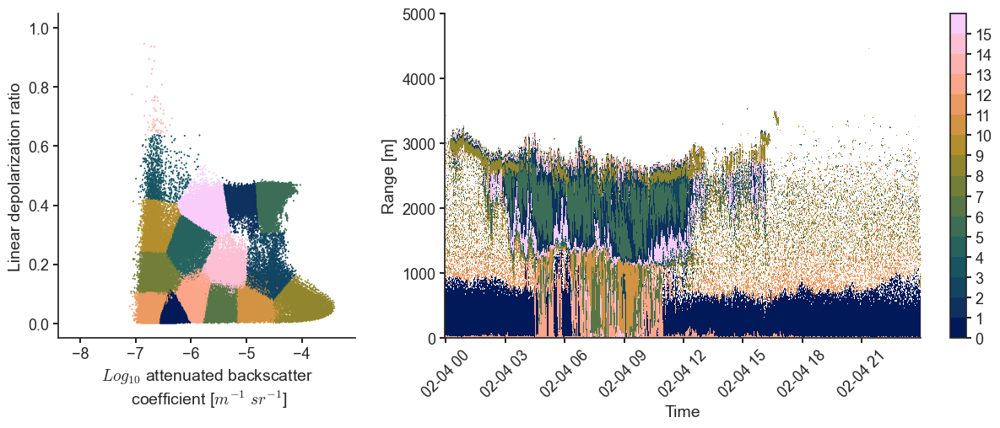

saving results under followingkmean_clusters
Classifying cluster from kmean_clusters
 Successful cluster classification stored in dataset under classified_clusters
Saved element to ../Outputs/Feb04\classified_clusters.jpg


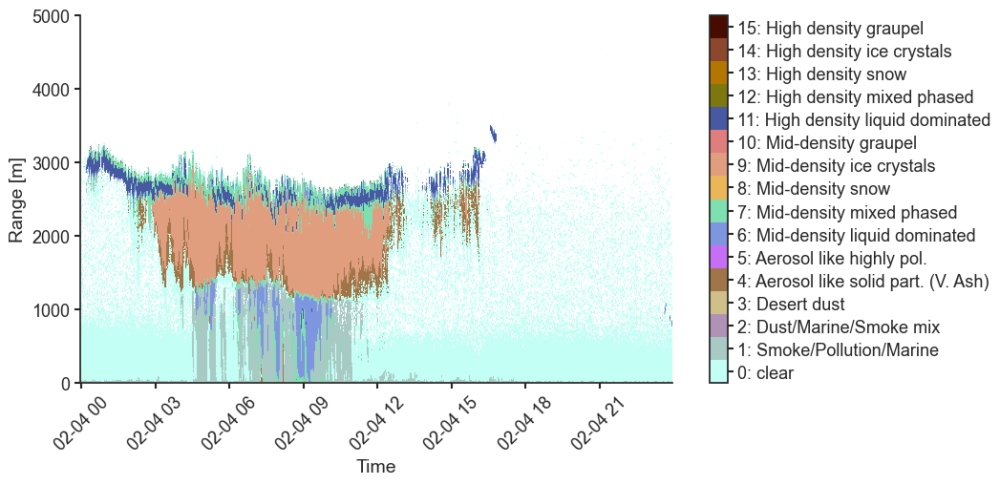

Step 3: Classify the elements and clusters based on the classification given in config file
Successful pixel-wise classification stored in dataset under classified_elements
Saved element to ../Outputs/Feb04\classified_elements.jpg


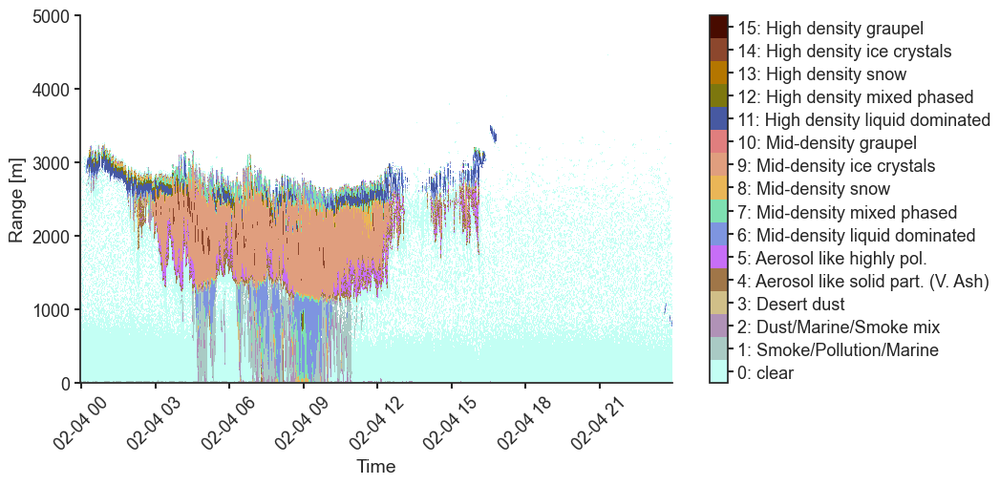

In [38]:
februar_04.auto_process(range_limits=[0,5000], save_into_folder="../Outputs/Feb04")

# 4. Case study 2: Greenfjord 28 June

In [10]:
june28 = mCL61.CL61Processor(folder_path="../Data_samples/", specific_filename="cl61_20230628.nc")

- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False
load data from specific filne cl61_20230628.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


Saving files into ../Outputs/Jun28


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to ../Outputs/Jun28\timeserie.jpg
Step 1: applying noise removal process
The results are stored under new variable: beta_att_clean, linear_depol_ratio_clean, noise mask and to_interpolate_mask
saved figure to ../Outputs/Jun28\denoised_timeserie.jpg


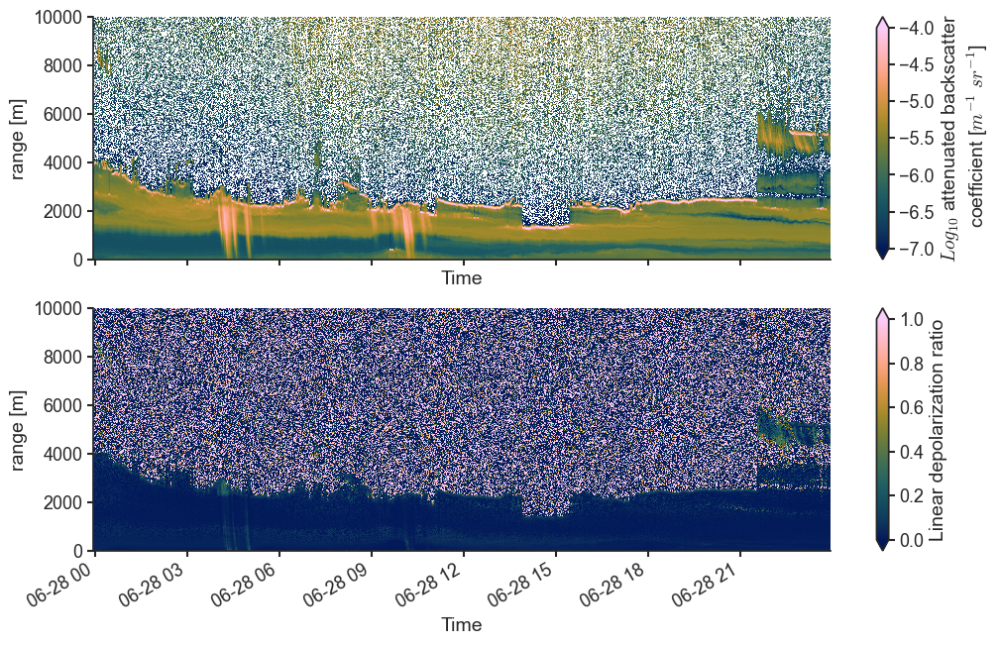

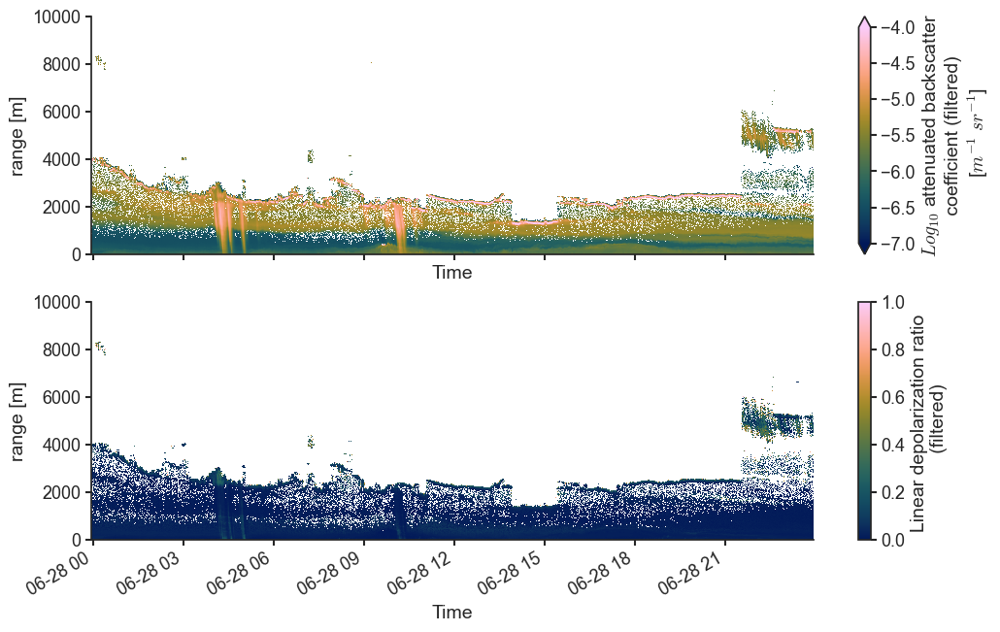

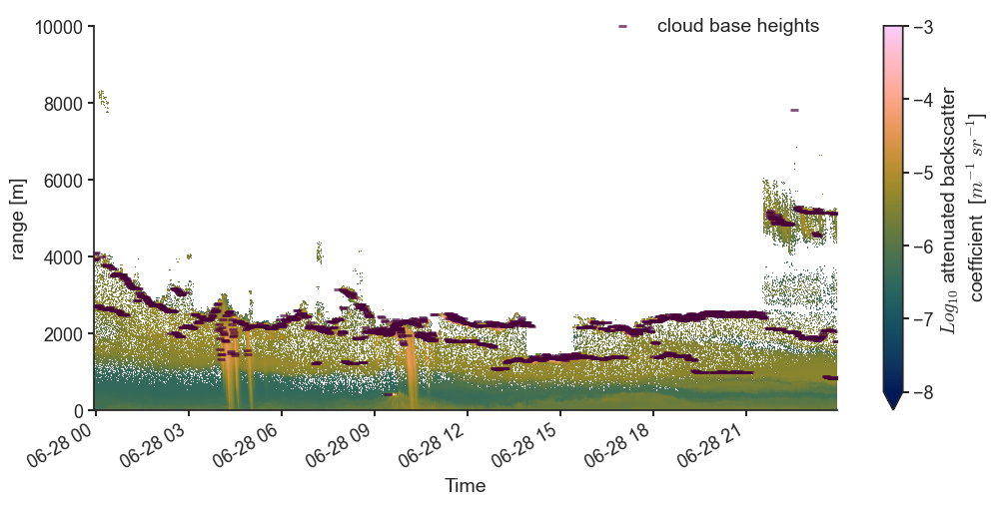

step 2: cluster data with kmean method
(4635540, 3)
Scaler means: [-5.64152437e+00  4.20340697e-02  1.36373752e+03]  
 and scales: [5.01994683e-01 7.62564553e-02 1.09187374e+03]


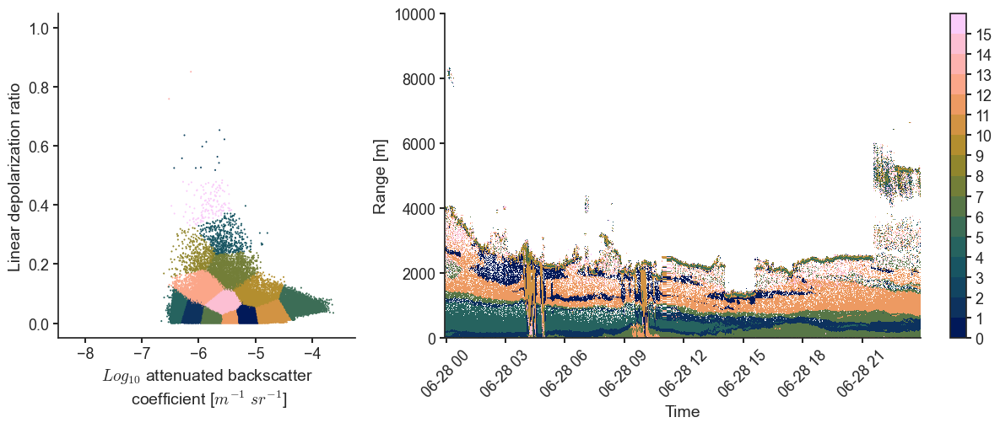

saving results under followingkmean_clusters
Classifying cluster from kmean_clusters
 Successful cluster classification stored in dataset under classified_clusters
Saved element to ../Outputs/Jun28\classified_clusters.jpg


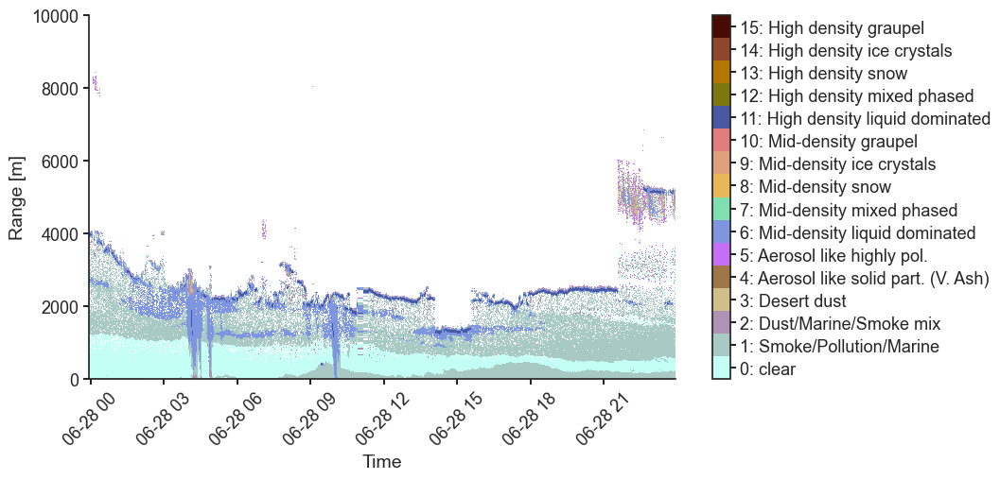

Step 3: Classify the elements and clusters based on the classification given in config file
Successful pixel-wise classification stored in dataset under classified_elements
Saved element to ../Outputs/Jun28\classified_elements.jpg


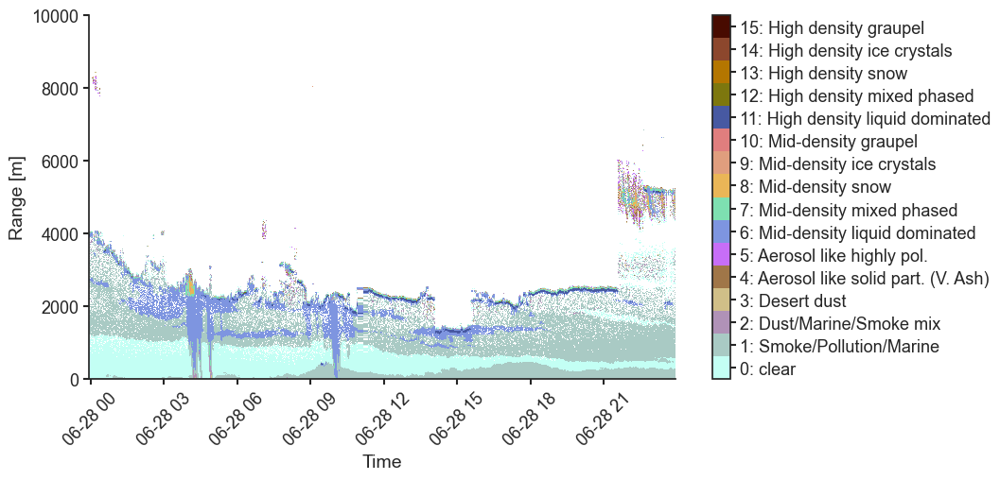

In [12]:
june28.auto_process(range_limits=[0,10000], save_into_folder="../Outputs/Jun28")

## Supp: Comparison to Hellikite measures

In [39]:
aerosol_file = "../Data_samples/Lv_0_Flight_4A_Aerosol.csv"
fc_st_file = "..\Data_samples\Lv_0_Flight_4A_FC_ST_STP_corr.csv"
df_aerosol = pd.read_csv(aerosol_file)
df_fc_st = pd.read_csv(fc_st_file)

df_aerosol['DateTime'] = pd.to_datetime(df_aerosol['DateTime'])
df_fc_st['DateTime_corr_unix'] = pd.to_datetime(df_fc_st['DateTime_corr_unix'])

C:\Users\gezas\AppData\Local\Temp\ipykernel_496\3556650123.py:7: UserWarning: Parsing dates in %d/%m/%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_fc_st['DateTime_corr_unix'] = pd.to_datetime(df_fc_st['DateTime_corr_unix'])


In [14]:
df_aerosol.head()

,DateTime,datetimes,sample_flow_l_min,sample_press_mbar,sample_temp_C,sigmab_smth,sigmag_smth,sigmar_smth,DateTime.1,Status,...,Bin_Conc33,Bin_Conc34,Bin_Conc35,Bin_Conc36,Bin_Conc37,Bin_Conc38,Bin_Conc39,Bin_Conc40,totalconc,Altitude_hypso
0,2023-06-28 07:37:00,3770782620,0.97,1000,14.6,5.375410,4.550497,3.213707,1.687938e+09,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
1,2023-06-28 07:37:01,3770782621,0.99,999,14.6,5.593356,4.685771,3.482973,1.687938e+09,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
2,2023-06-28 07:37:02,3770782622,1.04,999,14.5,5.624212,4.807650,3.563493,1.687938e+09,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.005669
3,2023-06-28 07:37:03,3770782623,0.96,1000,14.5,5.802501,4.876282,3.613314,1.687938e+09,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.005669
4,2023-06-28 07:37:04,3770782624,0.99,999,14.5,5.829835,5.064403,3.907074,1.687938e+09,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.196025


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


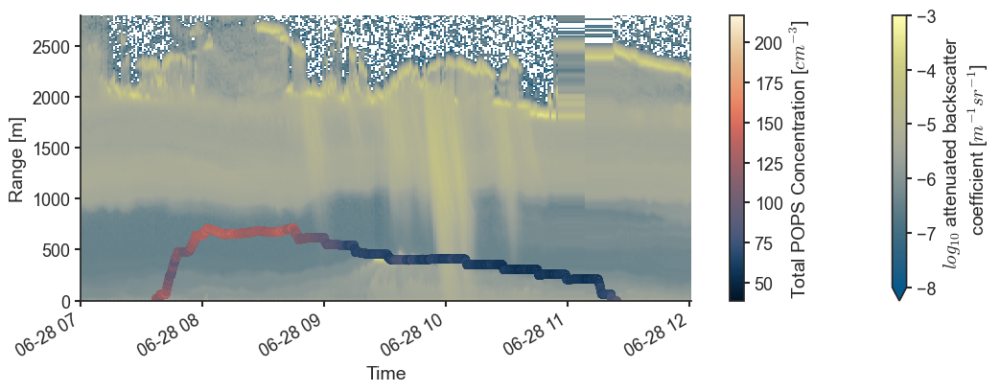

In [34]:
# Figure
fig, ax = plt.subplots(1, 1, figsize=(11, 4.2))

# Backscatter
arr = np.log10(june28.dataset['beta_att'].sel(range=slice(0, 2800), time=slice("2023-06-28 7:00", "2023-06-28 12:00")))
arr.attrs['long_name'] = 'log10 attenuated volume backscatter coefficient'
im = arr.plot.pcolormesh(x='time', y = 'range', vmin = -8, vmax = -3, cmap = 'cmc.nuuk')

cbar = im.colorbar
cbar.set_label("$log_{10}$ attenuated backscatter \n coefficient [$m^{-1}sr^{-1}$]")

# Aerosol concentration
scatter=ax.scatter(df_aerosol['DateTime'], df_aerosol['Altitude_hypso'], c=df_aerosol['total_POPS_conc'], cmap = 'cmc.lipari')

# Labels
ax.set_xlabel('Time')
ax.set_ylabel('Range [m]')
ax.set_title("")

# Add colorbar for the scatter plot
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Total POPS Concentration [$cm^{-3}$]')

plt.tight_layout()

plt.savefig('TotalPOPSConc.jpg', dpi = 400)

plt.show()

c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


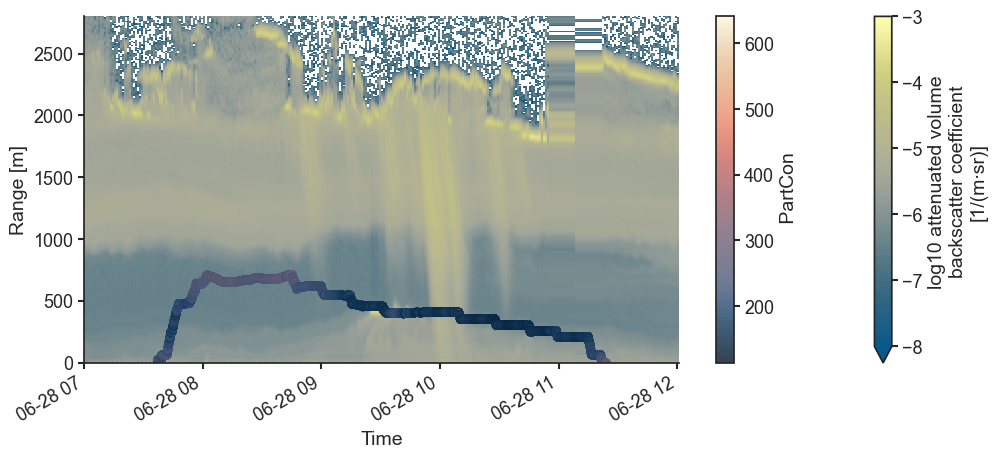

In [26]:
# Figure
fig, ax = plt.subplots(1, 1, figsize=(12, 4.5))

# Backscatter
arr = np.log10(june28.dataset['beta_att'].sel(range=slice(0, 2800), time=slice("2023-06-28 7:00", "2023-06-28 12:00")))
arr.attrs['long_name'] = 'log10 attenuated volume backscatter coefficient'
im = arr.plot.pcolormesh(x='time', y = 'range', vmin = -8, vmax = -3, cmap = 'cmc.nuuk')

# Aerosol concentration
scatter=ax.scatter(df_aerosol['DateTime'], df_aerosol['Altitude_hypso'], c=df_aerosol[' PartCon'], cmap = 'cmc.lipari', alpha = 0.8)

# Labels
ax.set_xlabel('Time')
ax.set_ylabel('Range [m]')
ax.set_title("")

# Add colorbar for the scatter plot
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label(' PartCon')

plt.show()

c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


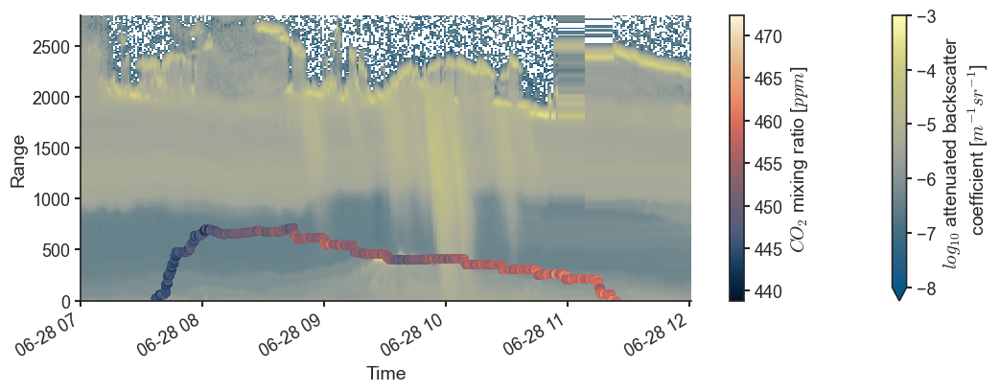

In [35]:
# Create a figure and axis
fig, ax = plt.subplots(1, 1, figsize=(11, 4.2))

# Backscatter
arr = np.log10(june28.dataset['beta_att'].sel(range=slice(0, 2800), time=slice("2023-06-28 7:00", "2023-06-28 12:00")))
arr.attrs['long_name'] = 'log10 attenuated volume backscatter coefficient'
im = arr.plot.pcolormesh(x='time', y = 'range', vmin = -8, vmax = -3, cmap = 'cmc.nuuk')

cbar = im.colorbar
cbar.set_label("$log_{10}$ attenuated backscatter \n coefficient [$m^{-1}sr^{-1}$]")

# Plot the second dataset (pandas)
scatter=ax.scatter(df_fc_st['DateTime_corr_unix'], df_fc_st['Altitude_hypso'], c=df_fc_st['CO2 moist'], cmap = 'cmc.lipari')

# Add labels, title, legend, etc. if needed
ax.set_xlabel('Time')
ax.set_ylabel('Range')
ax.set_title("")

# Add colorbar for the scatter plot
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('$CO_2$ mixing ratio [$ppm$]')

plt.tight_layout()

plt.savefig("CO2Conc.jpg", dpi = 400)


# 5. Case study 3: Saharan dust over Sion (22 Feb 2024)

In [13]:
folder_path = r"../CL61_module/temp"
start_dt = "2023-02-23 00:00"
end_dt = "2023-02-23 23:59"
feb23 = mCL61.CL61Processor(folder_path=folder_path, start_datetime=start_dt, end_datetime=end_dt)

- Getting filenames in data folder ... 
- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False


100%|██████████| 288/288 [00:27<00:00, 10.60it/s]

Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


In [29]:
feb22 = mCL61.CL61Processor(folder_path='../Data_samples/', specific_filename='cl61_20230222.nc')

- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False
load data from specific filne cl61_20230222.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


Saving files into ../Outputs/Feb22/


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to ../Outputs/Feb22/timeserie.jpg
Step 1: applying noise removal process
The results are stored under new variable: beta_att_clean, linear_depol_ratio_clean, noise mask and to_interpolate_mask
saved figure to ../Outputs/Feb22/denoised_timeserie.jpg


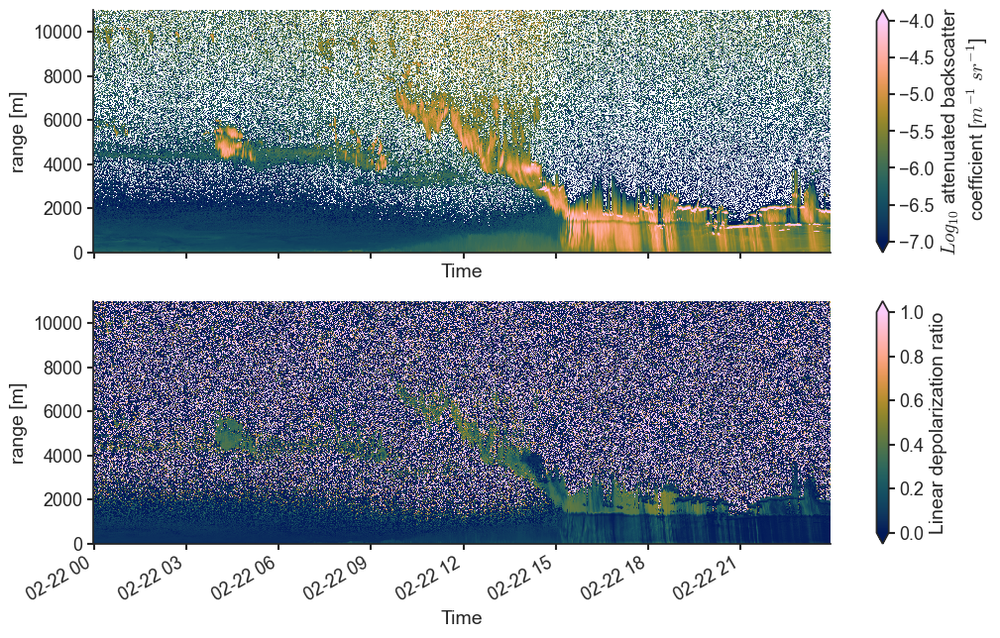

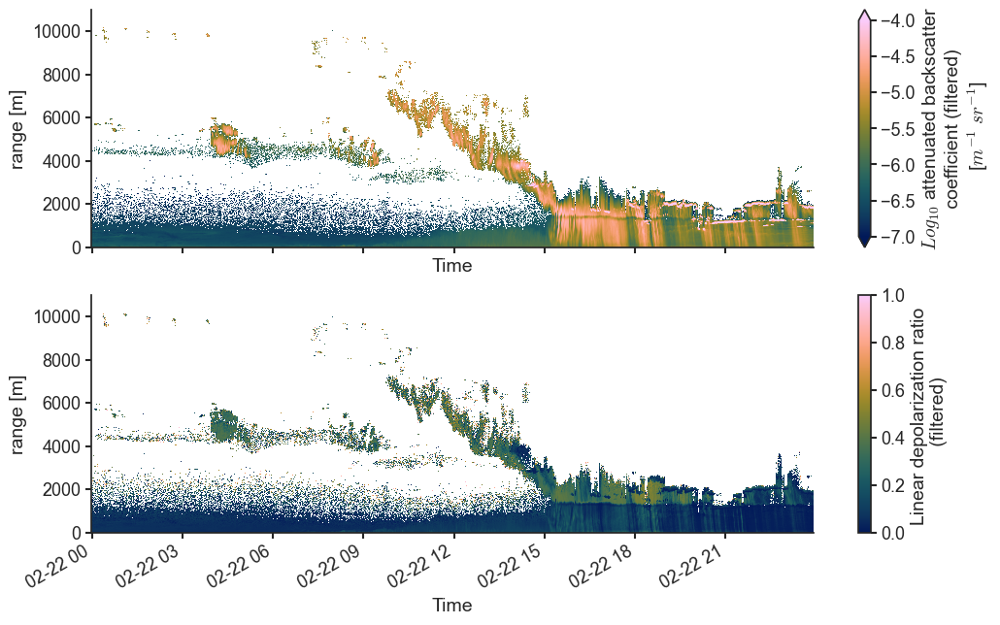

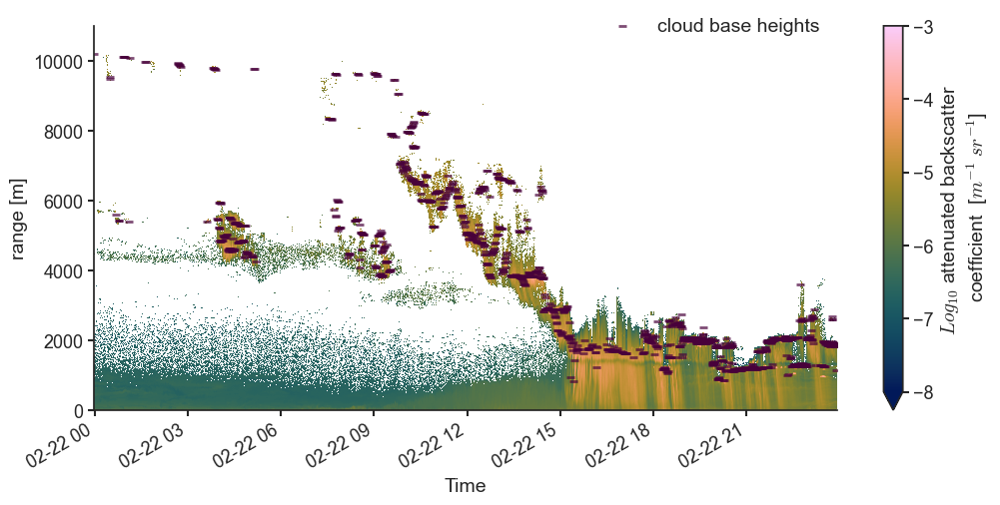

step 2: cluster data with kmean method
(4701060, 3)
Scaler means: [-5.83793593e+00  1.74732095e-01  1.80478805e+03]  
 and scales: [7.02716557e-01 1.70202953e-01 1.72734465e+03]


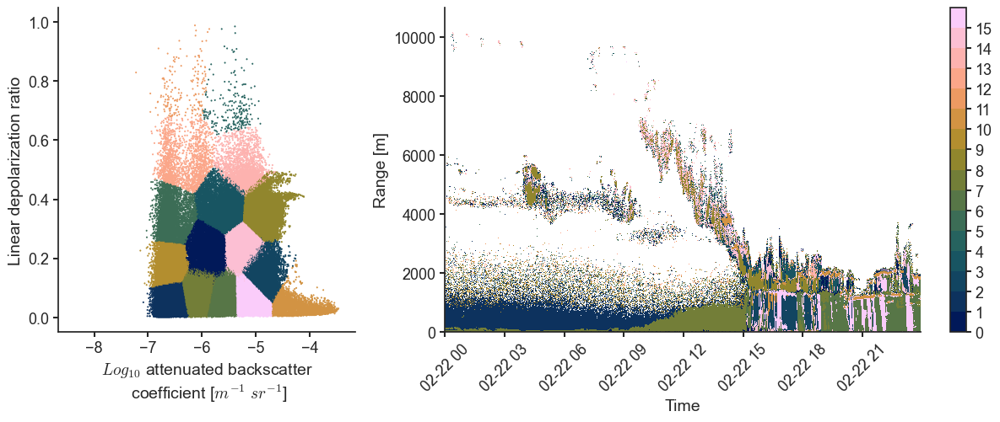

saving results under followingkmean_clusters
Classifying cluster from kmean_clusters
 Successful cluster classification stored in dataset under classified_clusters
Saved element to ../Outputs/Feb22/classified_clusters.jpg


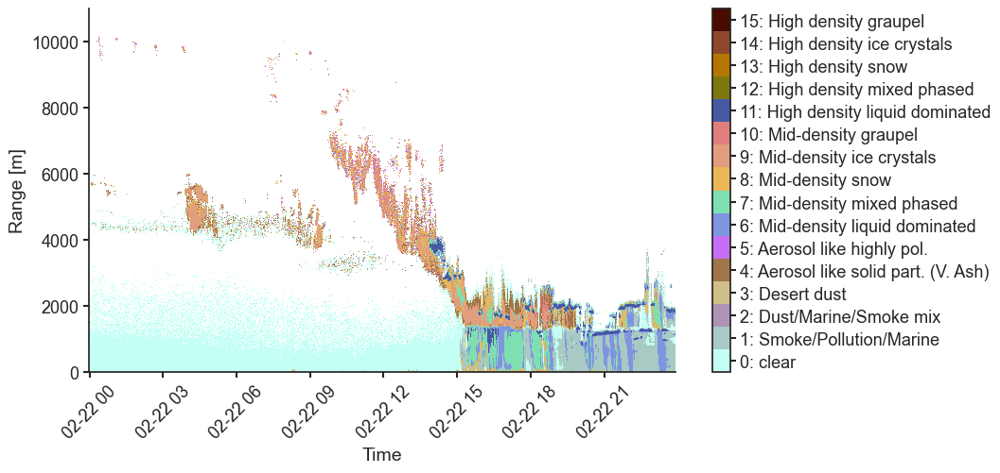

Step 3: Classify the elements and clusters based on the classification given in config file
Successful pixel-wise classification stored in dataset under classified_elements
Saved element to ../Outputs/Feb22/classified_elements.jpg


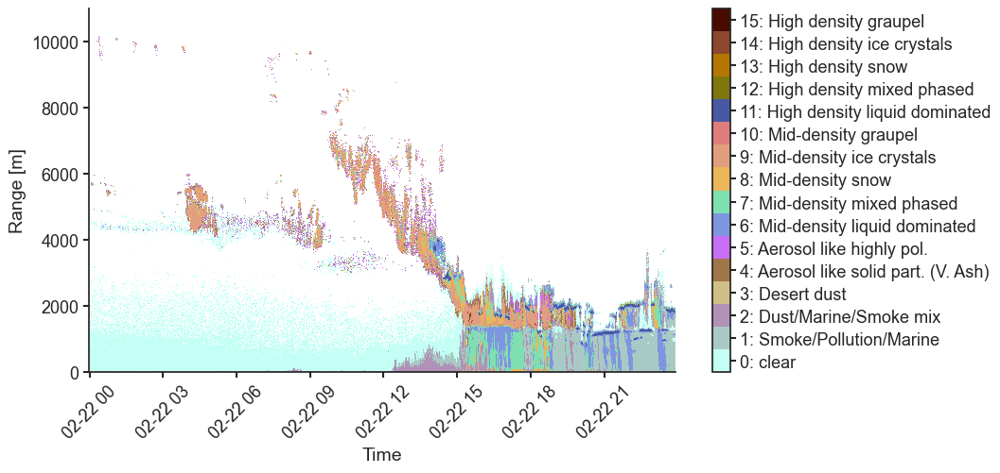

In [31]:
feb22.auto_process(range_limits = [0,11000], save_into_folder="../Outputs/Feb22/")

array([<Axes: xlabel='time', ylabel='range [m]'>,
       <Axes: xlabel='time', ylabel='range [m]'>], dtype=object)

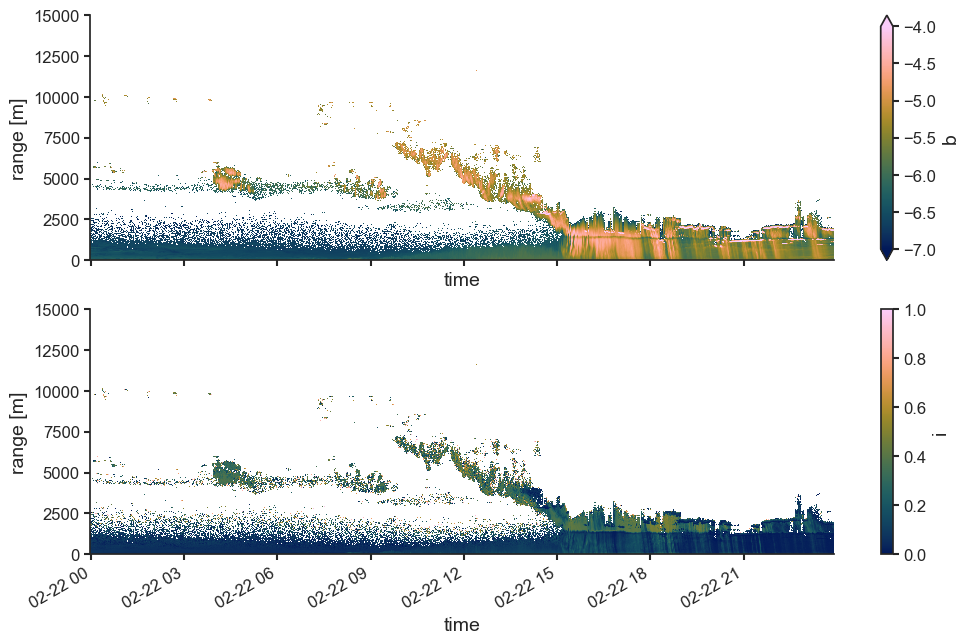

In [24]:
feb22.plot.show_timeserie(variable_names=['beta_att_clean', 'linear_depol_ratio_clean'])

In [20]:
feb23 = mCL61.CL61Processor(folder_path='../Data_samples/', specific_filename='cl61_20230223.nc')

- Loading dataset from files with parameter: 
 	 load_to_memory=False,transfer_files_locally=False, parallel_computing = False
load data from specific filne cl61_20230223.nc
Loading config file at c:\Users\gezas\kDrive\SIE-Project\CL61\CL61_module\config_classification.json 
Module initialization completed !


Saving files into ../Outputs/Feb23/


c:\Users\gezas\.conda\envs\atm\Lib\site-packages\xarray\core\computation.py:761: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


saved figure to ../Outputs/Feb23/timeserie.jpg
Step 1: applying noise removal process
The results are stored under new variable: beta_att_clean, linear_depol_ratio_clean, noise mask and to_interpolate_mask
saved figure to ../Outputs/Feb23/denoised_timeserie.jpg


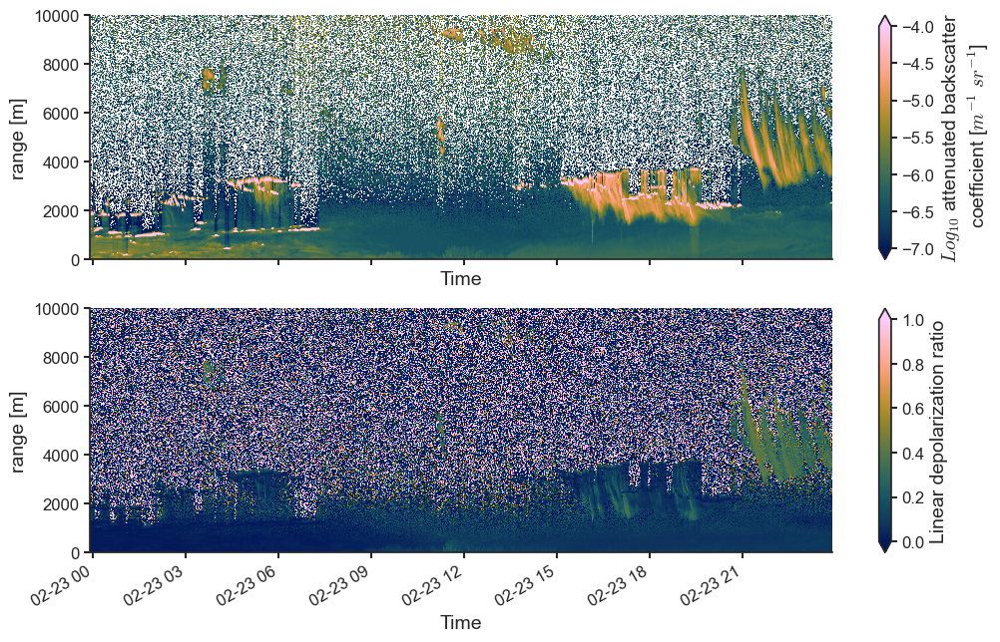

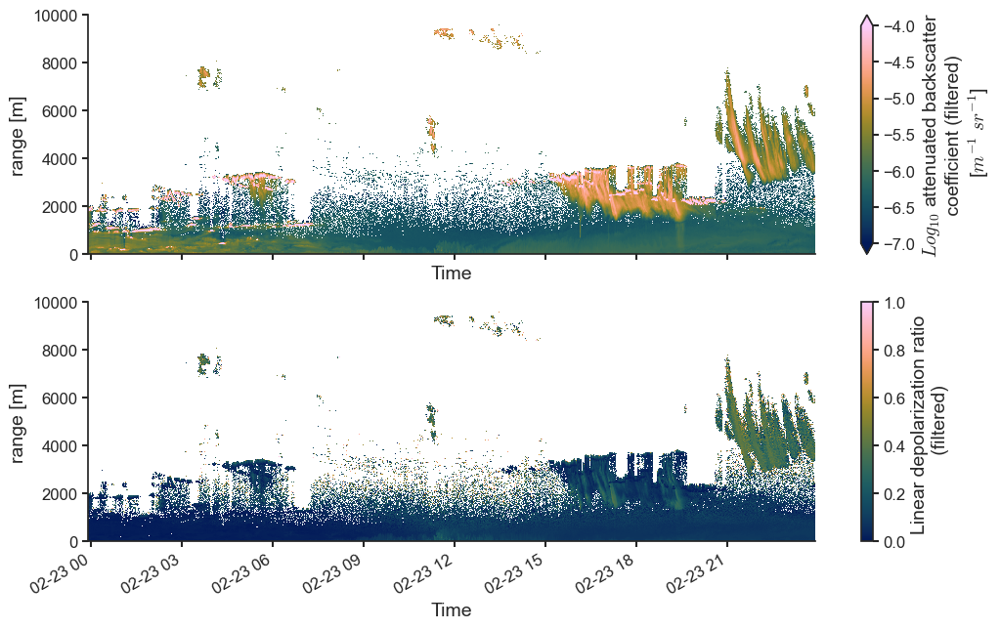

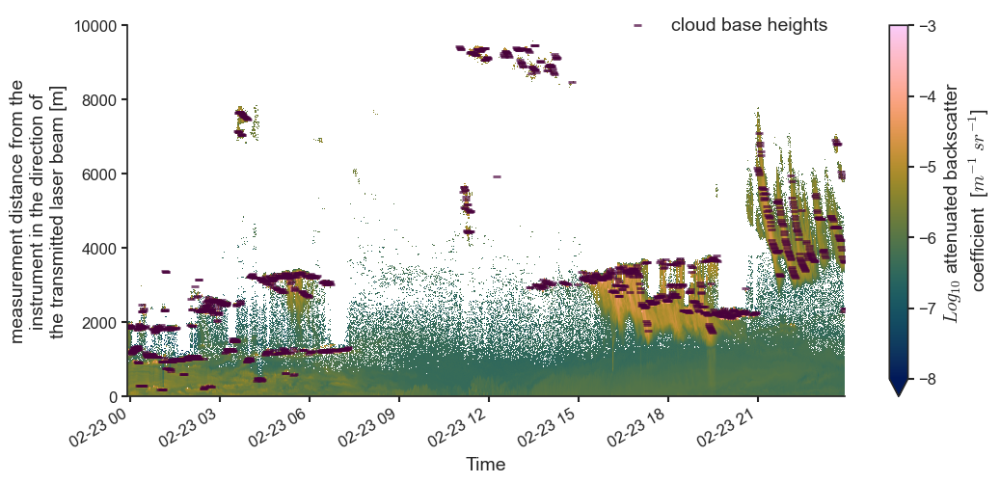

step 2: cluster data with kmean method
(4717440, 3)
Scaler means: [-5.94675093e+00  1.39367878e-01  1.80931590e+03]  
 and scales: [5.84512327e-01 1.48081137e-01 1.54700708e+03]


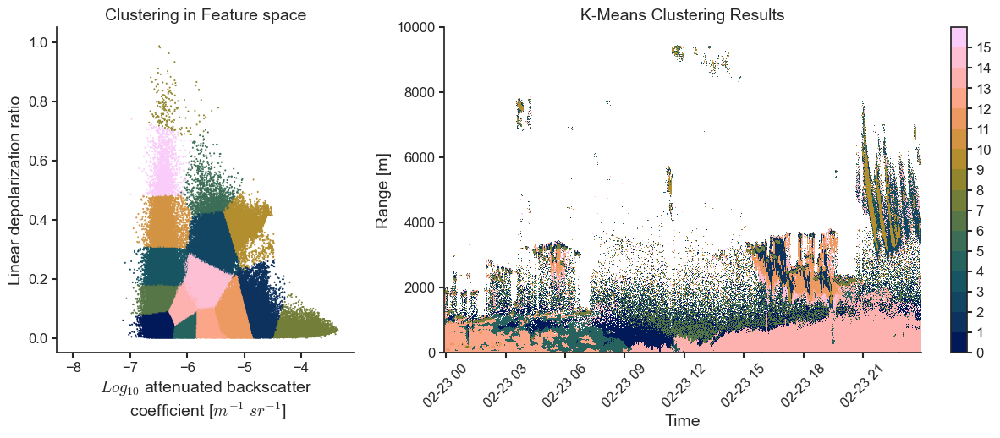

saving results under followingkmean_clusters
Classifying cluster from kmean_clusters
 Successful cluster classification stored in dataset under classified_clusters
Saved element to ../Outputs/Feb23/classified_clusters.jpg


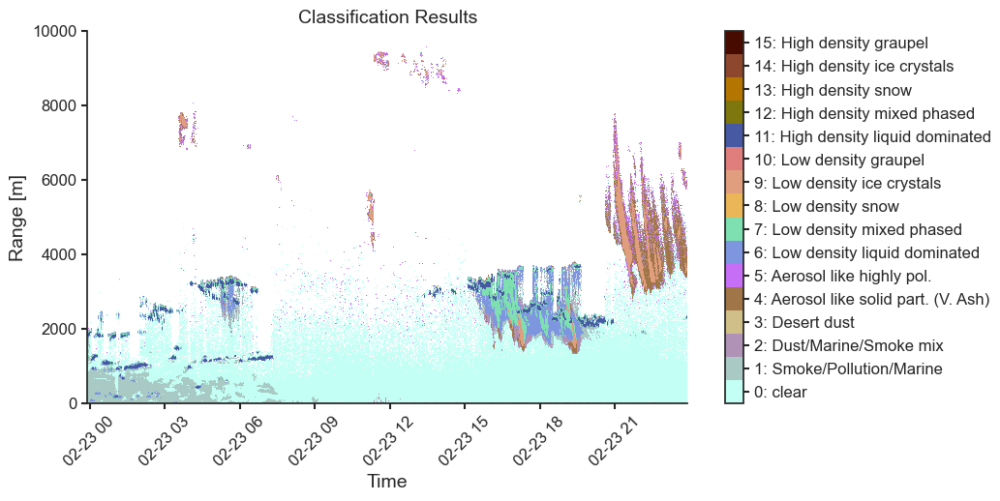

Step 3: Classify the elements and clusters based on the classification given in config file
Successful pixel-wise classification stored in dataset under classified_elements
Saved element to ../Outputs/Feb23/classified_elements.jpg


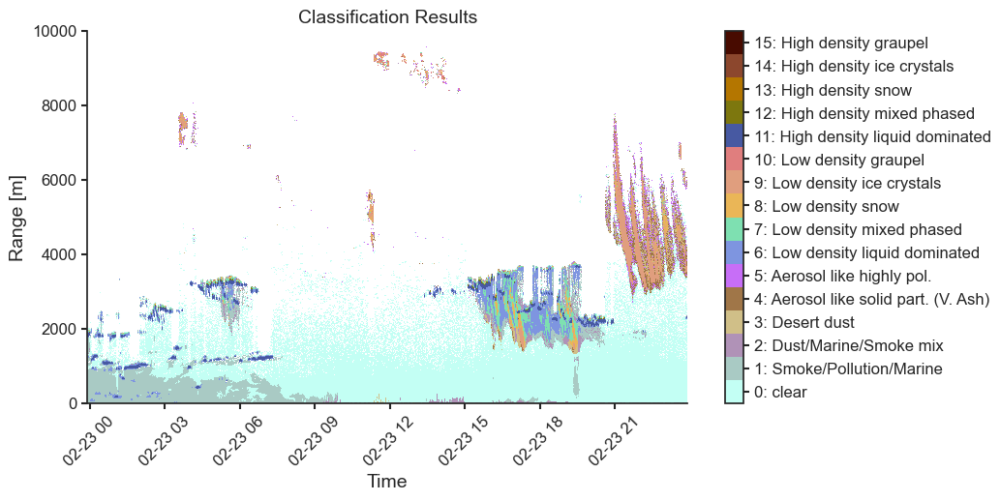

In [22]:
feb23.auto_process(range_limits = [0,10000], save_into_folder="../Outputs/Feb23/")